In [61]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
%matplotlib inline
import seaborn as sns
sns.set(style='whitegrid')
import os
import glob as gb
import cv2
import tensorflow as tf
import keras
from tqdm import tqdm
from sklearn.utils import shuffle
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [2]:
trainpath='C:/Users/Farah/python/deep learning/CNN/archive/seg_train/seg_train'
testpath='C:/Users/Farah/python/deep learning/CNN/archive/seg_test/seg_test'
predpath='C:/Users/Farah/python/deep learning/CNN/archive/seg_pred/seg_pred'

In [3]:
print(os.listdir(testpath))

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


In [66]:
class_names = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

In [6]:
seg_test_path = os.path.join(testpath)

for folder in os.listdir(seg_test_path):
    folder_path = os.path.join(seg_test_path, folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    print(f'For testing data, found {len(files)} in folder {folder}')

For testing data, found 437 in folder buildings
For testing data, found 474 in folder forest
For testing data, found 553 in folder glacier
For testing data, found 525 in folder mountain
For testing data, found 510 in folder sea
For testing data, found 501 in folder street


In [7]:
seg_pred_path = os.path.join(predpath)
files = gb.glob(os.path.join(seg_pred_path, '*.jpg'))
print(f'For predincting data, found {len(files)} in folder {folder}')

For predincting data, found 7301 in folder street


In [9]:
seg_train_path = os.path.join(trainpath)

for folder in os.listdir(seg_train_path):
    folder_path = os.path.join(seg_train_path, folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    print(f'For training data, found {len(files)} in folder {folder}')

For training data, found 2191 in folder buildings
For training data, found 2271 in folder forest
For training data, found 2404 in folder glacier
For training data, found 2512 in folder mountain
For training data, found 2274 in folder sea
For training data, found 2382 in folder street


In [10]:
#cheking images
code={'buildings':0, 'forest':1, 'glacier':2, 'mountain':3, 'sea':4, 'street':5}
def getcode(n):
    for x,y in code.items():
        if n==y:
            return x

# Load Data

In [25]:
s=100
def load_data():
    output=[]
    dataset=[trainpath,testpath]
    for path in dataset:
        X,y=[],[]
        for folder in tqdm(os.listdir(os.path.join(path))):
            folder_path=os.path.join(path,folder)
            files=gb.glob(os.path.join(folder_path, '*.jpg'))
            for file in files:
                img=cv2.imread(file)
                if img is None: 
                    continue
                img_array=cv2.resize(img,(s,s))
                X.append(img_array)
                y.append(code[folder])
        X = np.array(X)
        y = np.array(y)
        output.append((X, y))
    return output

In [33]:
(X_train, y_train), (X_test, y_test) = load_data()

100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


In [48]:
X_pred=[]
files = gb.glob(os.path.join(predpath, '*.jpg'))
for file in files:
    img=cv2.imread(file)
    img_array=cv2.resize(img,(s,s))
    X_pred.append(list(img_array))

In [50]:
X_pred=np.array(X_pred)

In [51]:
X_pred.shape

(7301, 100, 100, 3)

# The dataset consists of sequential images featuring dogs followed by images of cats grouped together. We will now randomize the order of the data.

In [38]:
X_train, y_train = shuffle(X_train, y_train, random_state=25)

In [39]:
X_train.shape

(14034, 100, 100, 3)

In [41]:
X_test.shape

(3000, 100, 100, 3)

# Plot Sample Image

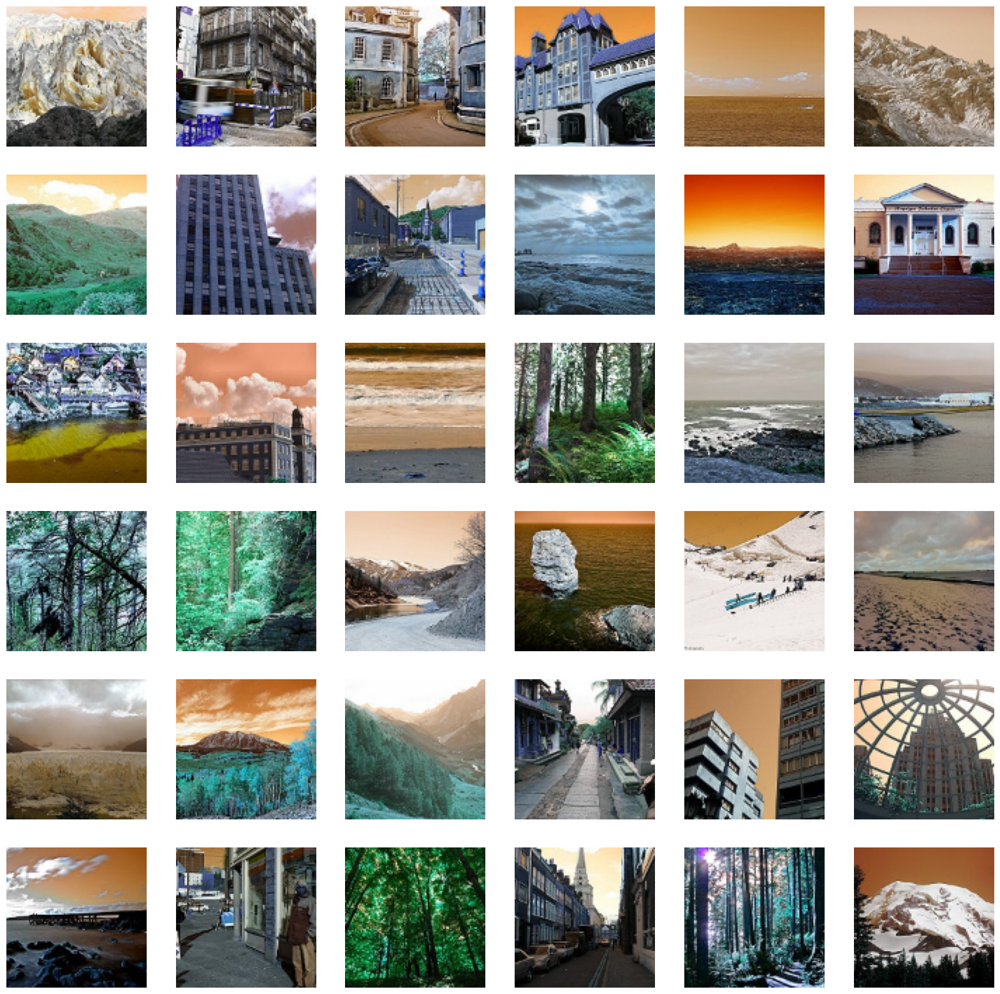

In [53]:
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(X_pred),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])
    plt.axis('off')

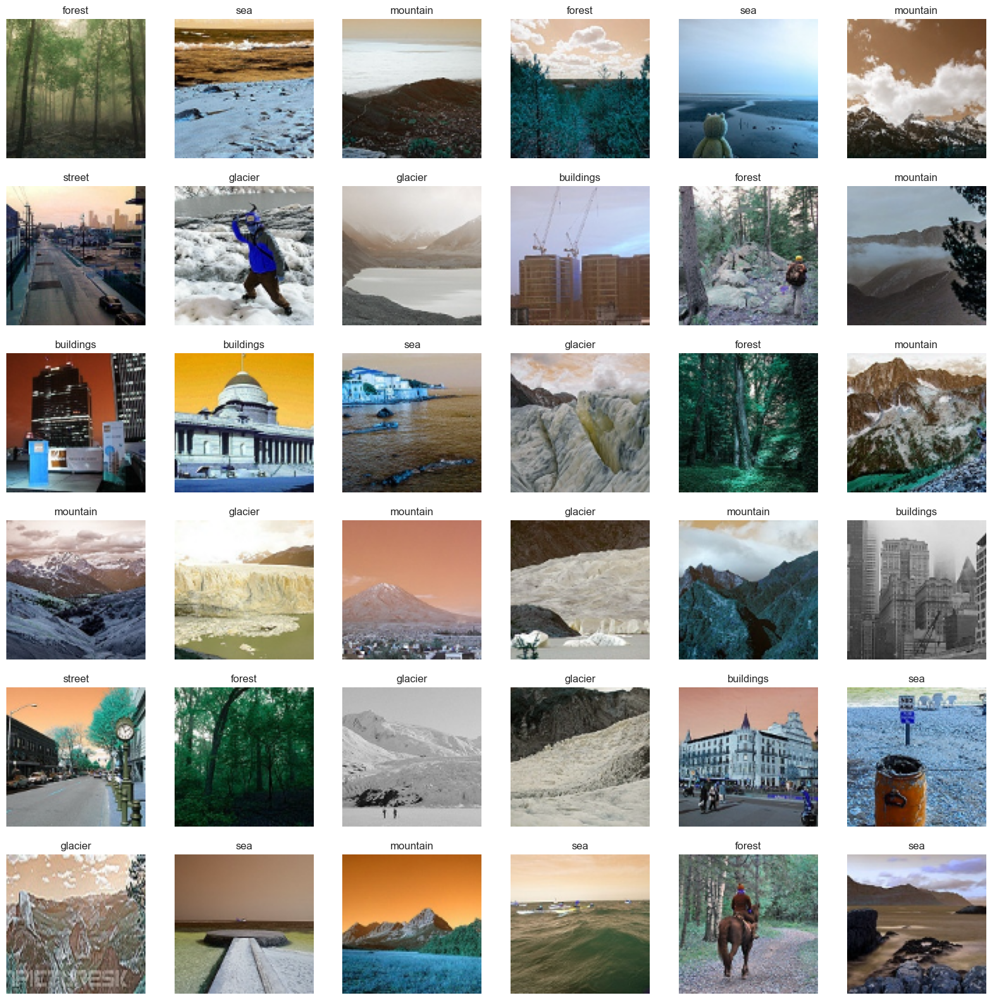

In [54]:
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(X_test),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(getcode(y_test[i]))

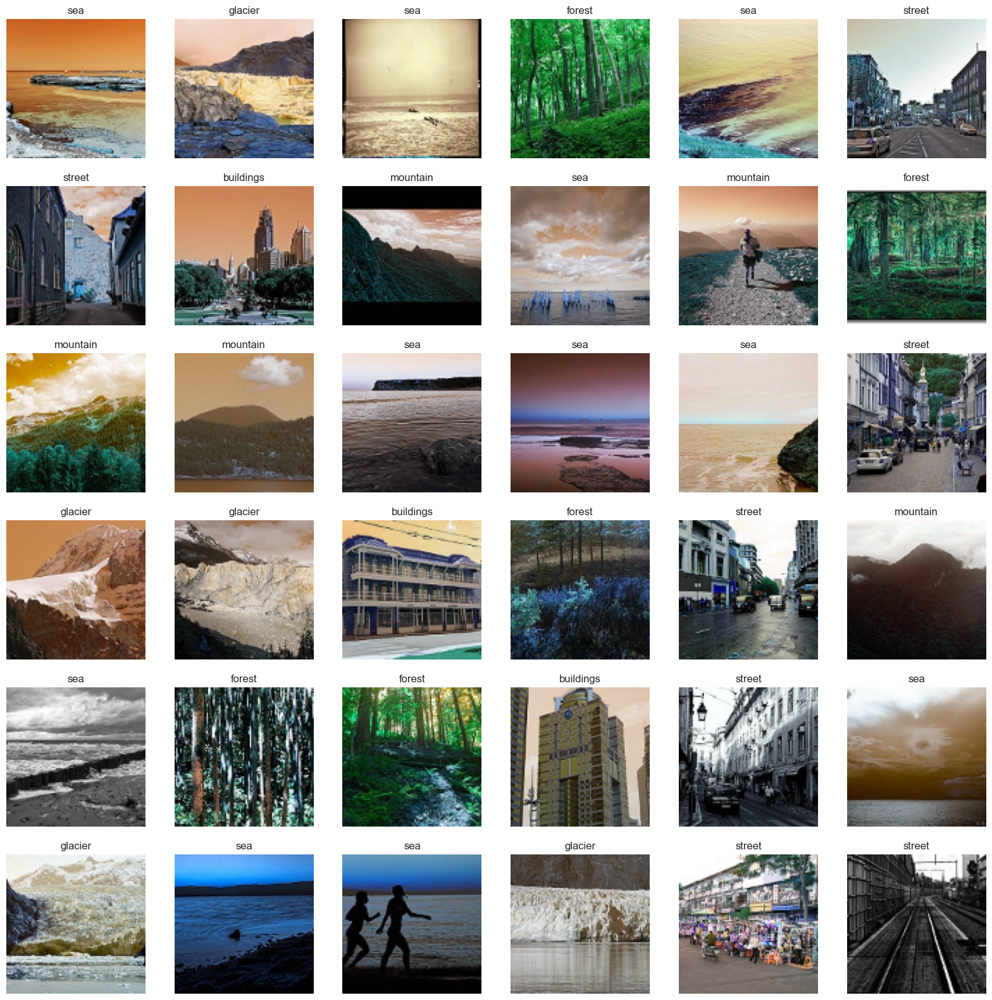

In [55]:
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(X_train),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])
    plt.axis('off')
    plt.title(getcode(y_train[i]))

# Model Training

In [56]:
KerasModel = keras.models.Sequential([
        keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Flatten() ,    
        keras.layers.Dense(120,activation='relu') ,    
        keras.layers.Dense(100,activation='relu') ,    
        keras.layers.Dense(50,activation='relu') ,        
        keras.layers.Dropout(rate=0.5) ,            
        keras.layers.Dense(6,activation='softmax') ,    
        ])

In [57]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [58]:
print(KerasModel.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 98, 98, 200)       5600      
                                                                 
 conv2d_1 (Conv2D)           (None, 96, 96, 150)       270150    
                                                                 
 max_pooling2d (MaxPooling2  (None, 24, 24, 150)       0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 22, 22, 120)       162120    
                                                                 
 conv2d_3 (Conv2D)           (None, 20, 20, 80)        86480     
                                                                 
 conv2d_4 (Conv2D)           (None, 18, 18, 50)        36050     
                                                        

In [62]:
#Callbacks
earlystop = EarlyStopping(patience=10)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.1, 
                                            min_lr=0.00001)

In [63]:
callbacks = [earlystop, learning_rate_reduction]

In [65]:
%%time
#Fit Model
epochs = 50
ThisModel = KerasModel.fit(X_train, y_train, epochs=epochs,batch_size=64,verbose=1, callbacks=callbacks)

Epoch 1/50
220/220 [==============================] - 2872s 13s/step - loss: 1.2955 - accuracy: 0.4539 - lr: 0.0010
Epoch 2/50
220/220 [==============================] - 3311s 15s/step - loss: 1.0236 - accuracy: 0.5968 - lr: 0.0010
Epoch 3/50
220/220 [==============================] - 3286s 15s/step - loss: 0.9246 - accuracy: 0.6468 - lr: 0.0010
Epoch 4/50
220/220 [==============================] - 3397s 15s/step - loss: 0.8397 - accuracy: 0.6850 - lr: 0.0010
Epoch 5/50
220/220 [==============================] - 3380s 15s/step - loss: 0.7588 - accuracy: 0.7281 - lr: 0.0010
Epoch 6/50
220/220 [==============================] - 4917s 22s/step - loss: 0.7032 - accuracy: 0.7545 - lr: 0.0010
Epoch 7/50
 91/220 [===========>..................] - ETA: 36:48 - loss: 0.6253 - accuracy: 0.7902

KeyboardInterrupt: 

In [67]:
#Save the Model
KerasModel.save('predict.h5')

C:\Users\Farah\AppData\Roaming\Python\Python39\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [68]:
#Model Evaluation
modelloss,modelAccuracy=KerasModel.evaluate(X_test,y_test)
print('test loss: {}'.format(modelloss))
print('test accuracy: {}'.format(modelAccuracy))

94/94 [==============================] - 164s 2s/step - loss: 0.6192 - accuracy: 0.7723
test loss: 0.6191904544830322
test accuracy: 0.7723333239555359


In [90]:
#Making Predictions
y_pred = KerasModel.predict(X_test)
pred_label = np.argmax(y_pred, axis = 1)

94/94 [==============================] - 234s 2s/step


In [91]:
test_label = np.argmax(y_pred, axis = 1)

In [92]:
class_names=[0,1,2,3,4,5]

In [93]:
y_pred=np.argmax(y_pred,axis=1)
y_pred

array([0, 0, 0, ..., 3, 0, 5], dtype=int64)

In [94]:
#Classification Report
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred, target_names = class_names))

TypeError: object of type 'int' has no len()